<a href="https://colab.research.google.com/github/mp22abw/ADS-Resubmit/blob/main/Image_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
import seaborn as sns


In [2]:
#  Loading the dataset
def load_data(dataset_path):
    data = {}
    for subset in os.listdir(dataset_path):
        subset_path = os.path.join(dataset_path, subset)
        if os.path.isdir(subset_path):
            data[subset] = {}
            if subset == 'test-30':
                data[subset]['images'] = [os.path.join(subset_path, img) for img in os.listdir(subset_path) if img.endswith('.jpg')]
            else:
                labels_file = os.path.join(subset_path, "labels.json")
                with open(labels_file, 'r') as f:
                    data[subset]['labels'] = json.load(f)
                images_folder = os.path.join(subset_path, "data")
                data[subset]['images'] = [os.path.join(images_folder, img) for img in os.listdir(images_folder) if img.endswith('.jpg')]
    return data

In [3]:
import matplotlib.patches as patches
def eda(dataset):
    for subset, data in dataset.items():
        print(f"\n{subset.capitalize()} subset:")

        if subset == 'test-30':
            print(f"Number of images: {len(data['images'])}")
        else:
            labels = data['labels']
            images = data['images']

            categories = {category['name']: 0 for category in labels['categories']}
            for annotation in labels['annotations']:
                categories[labels['categories'][annotation['category_id']]['name']] += 1

            print("Class Distribution:")
            for category, count in categories.items():
                print(f"{category}: {count}")

            print("\nSample Images with Bounding Boxes:")
            for img_path in images[:5]:  # Limit to first 5 images
                image = Image.open(img_path)
                plt.figure(figsize=(10, 10))
                plt.imshow(image)
                plt.axis('off')

                # Draw bounding boxes
                ax = plt.gca()
                for annotation in labels['annotations']:
                    if annotation['image_id'] == os.path.basename(img_path).split('.')[0]:
                        x, y, width, height = annotation['bbox']
                        rect = patches.Rectangle((100, 100), 50, 50, linewidth=2, edgecolor='r', facecolor='none')
                        ax.add_patch(rect)

                plt.show()

Mounted at /content/drive
Archive:  /content/drive/MyDrive/RM_Segmentation_Assignment_dataset.zip
  inflating: /content/drive/MyDrive/unzipped_dataset/test-30/000000001751.jpg  
  inflating: /content/drive/MyDrive/unzipped_dataset/test-30/000000001380.jpg  
  inflating: /content/drive/MyDrive/unzipped_dataset/test-30/000000001643.jpg  
  inflating: /content/drive/MyDrive/unzipped_dataset/test-30/000000001583.jpg  
  inflating: /content/drive/MyDrive/unzipped_dataset/test-30/000000001685.jpg  
  inflating: /content/drive/MyDrive/unzipped_dataset/test-30/000000001482.jpg  
  inflating: /content/drive/MyDrive/unzipped_dataset/test-30/000000001494.jpg  
  inflating: /content/drive/MyDrive/unzipped_dataset/test-30/000000001551.jpg  
  inflating: /content/drive/MyDrive/unzipped_dataset/test-30/000000001654.jpg  
  inflating: /content/drive/MyDrive/unzipped_dataset/test-30/000000001594.jpg  
  inflating: /content/drive/MyDrive/unzipped_dataset/test-30/000000001411.jpg  
  inflating: /content/

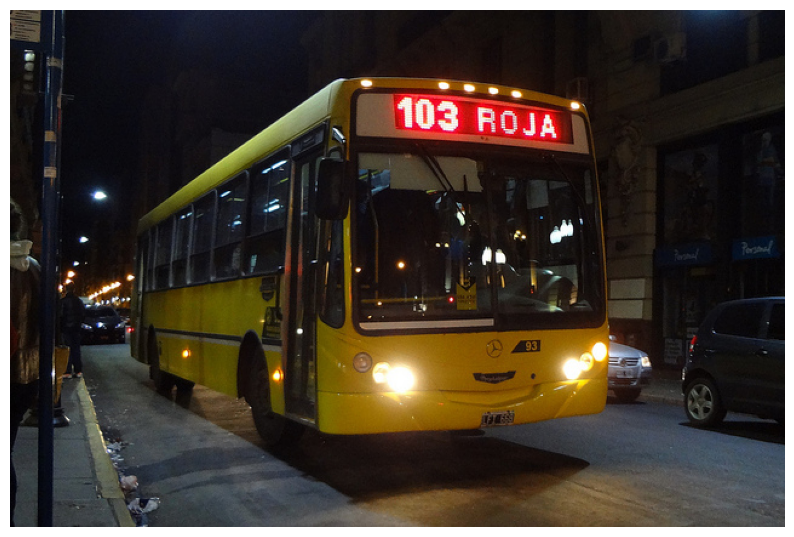

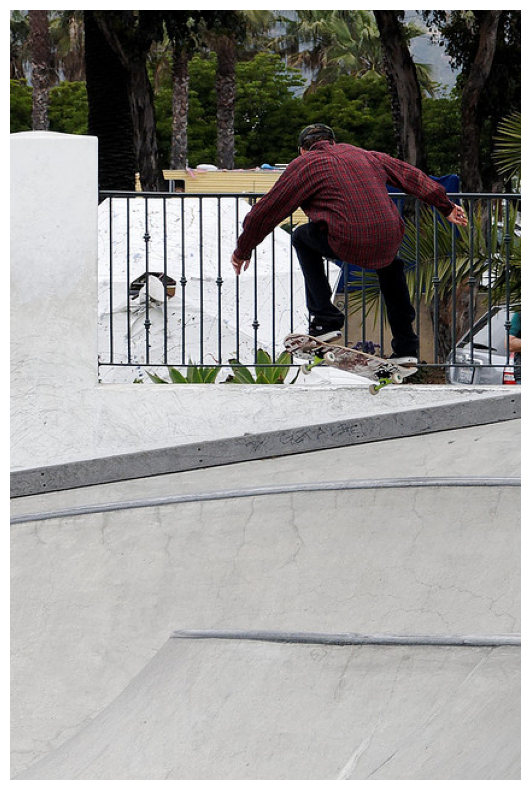

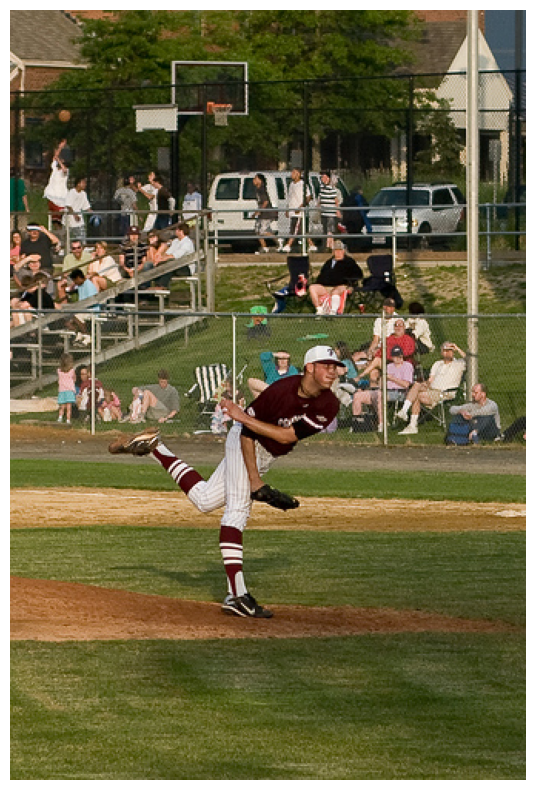

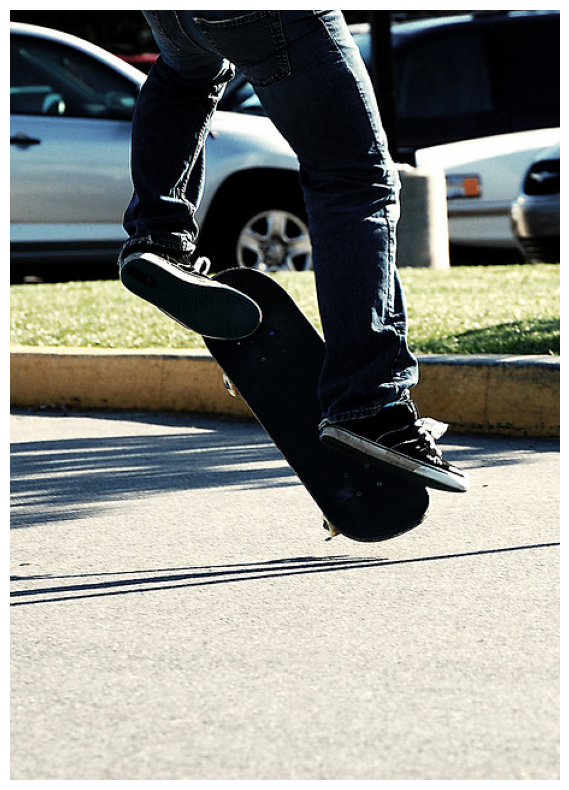

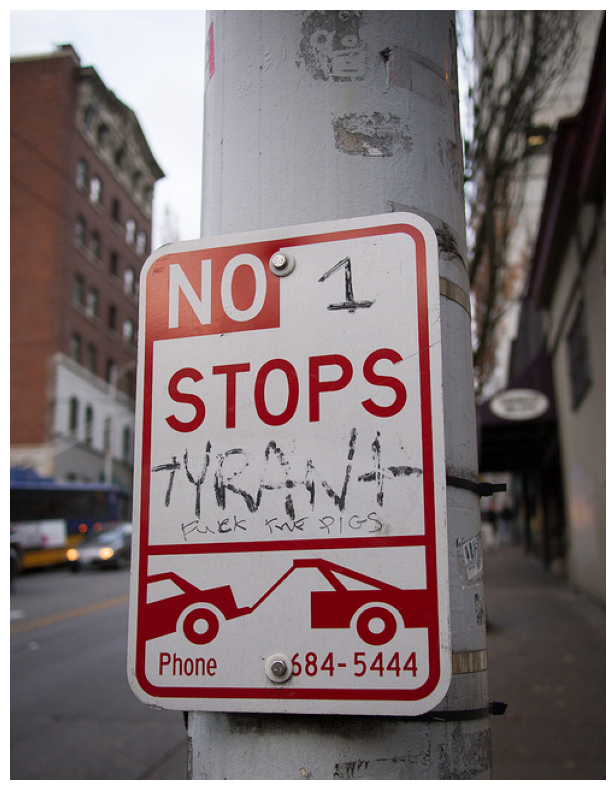


Train-300 subset:
Class Distribution:
airplane: 15
backpack: 84
banana: 15
baseball bat: 6
baseball glove: 12
bear: 3
bench: 49
bicycle: 125
bird: 57
boat: 20
book: 2
bottle: 10
bowl: 10
broccoli: 1
bus: 91
cake: 13
car: 1061
carrot: 4
cat: 4
cell phone: 19
chair: 51
clock: 17
cow: 1
cup: 21
dining table: 25
dog: 14
donut: 4
elephant: 5
fire hydrant: 9
fork: 6
frisbee: 3
giraffe: 1
handbag: 72
horse: 17
hot dog: 3
kite: 55
knife: 4
laptop: 2
motorcycle: 73
oven: 2
parking meter: 9
person: 1350
pizza: 10
potted plant: 9
refrigerator: 2
remote: 1
sandwich: 6
scissors: 2
skateboard: 30
skis: 11
spoon: 1
sports ball: 23
stop sign: 14
suitcase: 14
surfboard: 15
tennis racket: 7
tie: 12
traffic light: 167
train: 10
truck: 120
umbrella: 68
vase: 1
wine glass: 2

Sample Images with Bounding Boxes:


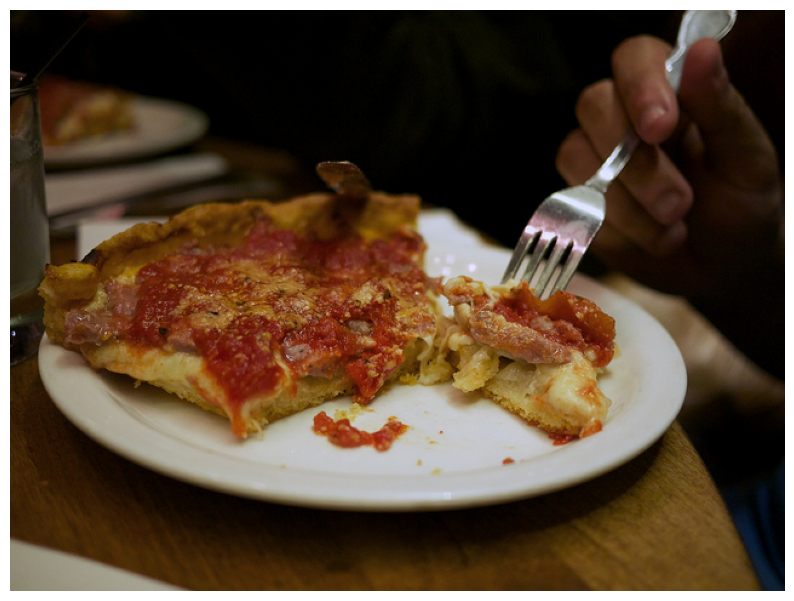

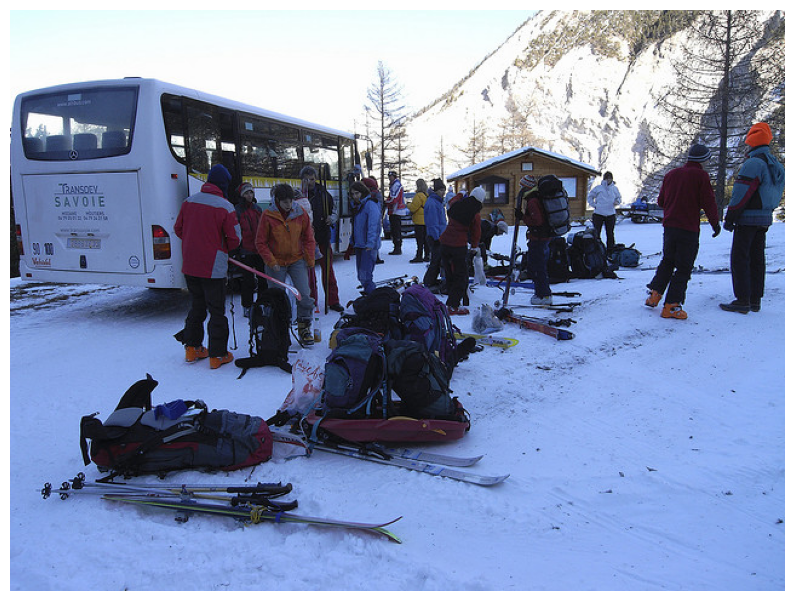

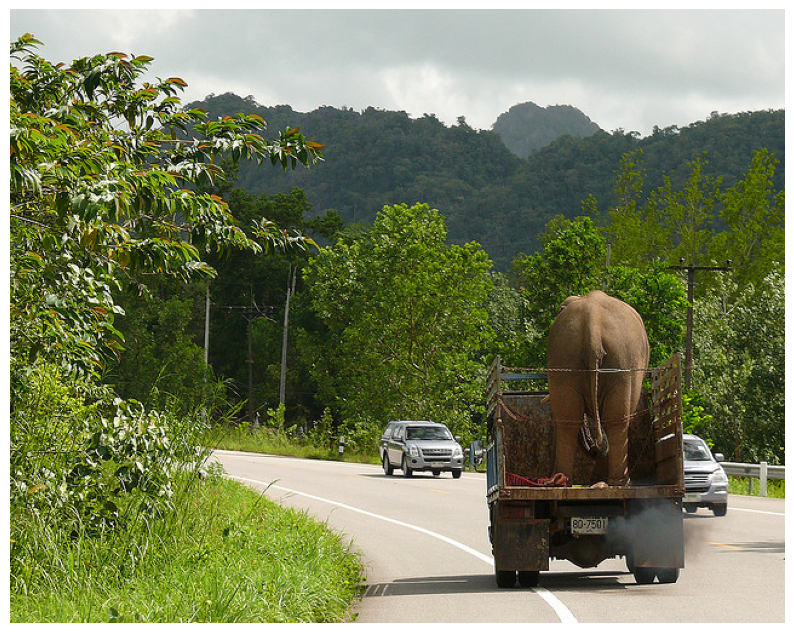

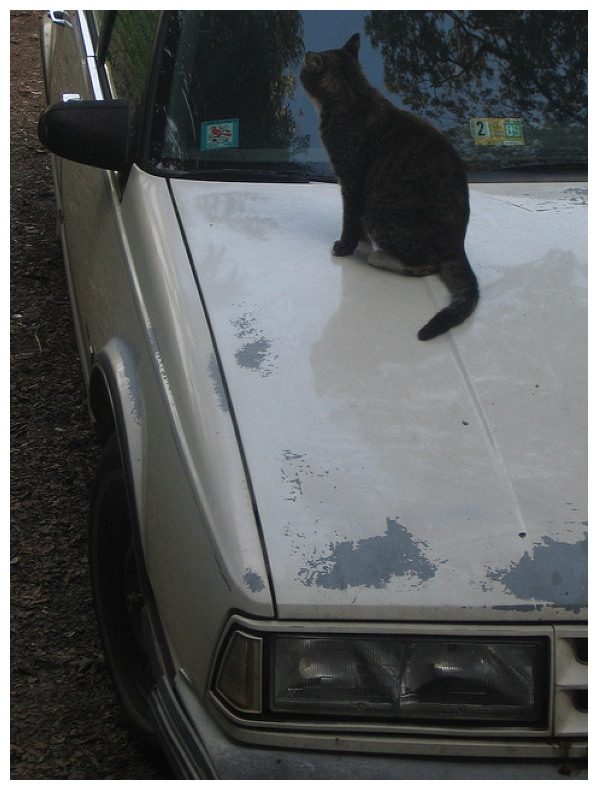

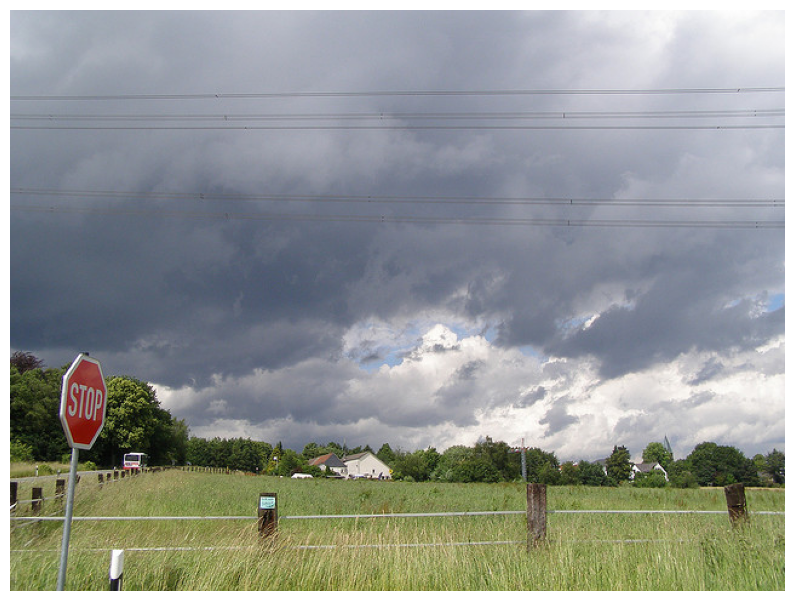

In [4]:
# Mounting datset from google drive
from google.colab import drive
drive.mount('/content/drive')
!unzip -o "/content/drive/MyDrive/RM_Segmentation_Assignment_dataset.zip" -d "/content/drive/MyDrive/unzipped_dataset/"
dataset_path = "/content/drive/MyDrive/unzipped_dataset"
dataset = load_data(dataset_path)
eda(dataset)

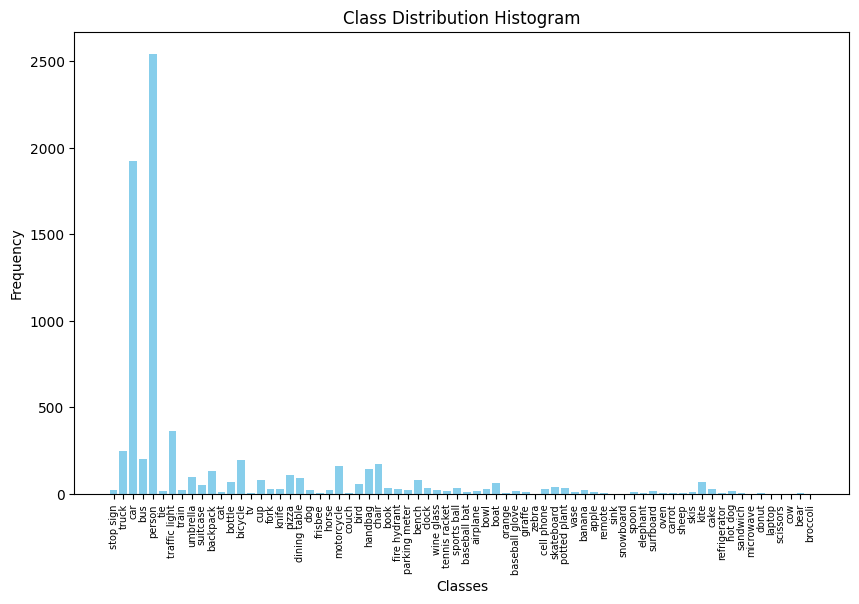

In [5]:
import pandas as pd
from PIL import Image
from sklearn.preprocessing import LabelEncoder
from itertools import combinations
from collections import Counter
from matplotlib_venn import venn2, venn2_circles

#  Loading  the dataset
def load_data(dataset_path):
    data = {}
    for subset in os.listdir(dataset_path):
        subset_path = os.path.join(dataset_path, subset)
        if os.path.isdir(subset_path):
            data[subset] = {}
            if subset == 'test-30':
                data[subset]['images'] = [os.path.join(subset_path, img) for img in os.listdir(subset_path) if img.endswith('.jpg')]
            else:
                labels_file = os.path.join(subset_path, "labels.json")
                with open(labels_file, 'r') as f:
                    data[subset]['labels'] = json.load(f)
                images_folder = os.path.join(subset_path, "data")
                data[subset]['images'] = [os.path.join(images_folder, img) for img in os.listdir(images_folder) if img.endswith('.jpg')]
    return data
dataset_path = '/content/drive/MyDrive/unzipped_dataset'
dataset = load_data(dataset_path)

#  Extract class distribution
def extract_class_distribution(dataset):
    class_distribution = {}
    for subset, data in dataset.items():
        if subset != 'test-30':
            labels = data['labels']
            for annotation in labels['annotations']:
                category_name = labels['categories'][annotation['category_id']]['name']
                if category_name in class_distribution:
                    class_distribution[category_name] += 1
                else:
                    class_distribution[category_name] = 1
    return class_distribution

class_distribution = extract_class_distribution(dataset)

# Plot histogram of class distribution
def plot_histogram(class_distribution):
    plt.figure(figsize=(10, 6))
    plt.bar(class_distribution.keys(), class_distribution.values(), color='skyblue')
    plt.xlabel('Classes')
    plt.ylabel('Frequency')
    plt.title('Class Distribution Histogram')
    plt.xticks(rotation=90)
    # Set the font size of x-axis tick labels
    plt.tick_params(axis='x', labelsize=7)
    plt.show()

plot_histogram(class_distribution)




In [6]:
# Implement R-CNN model for image segmentation (basic example using TensorFlow)
def create_rcnn_model(input_shape, num_classes):
    base_model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    for layer in base_model.layers:
        layer.trainable = False
    x = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
    x = tf.keras.layers.Dense(512, activation='relu')(x)
    x = tf.keras.layers.Dense(num_classes, activation='softmax')(x)
    model = tf.keras.models.Model(inputs=base_model.input, outputs=x)
    return model

def preprocess_image(img_path, target_size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=target_size)
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = tf.keras.applications.resnet.preprocess_input(img)
    return img

def data_generator(dataset, batch_size, target_size):
    num_classes = len(dataset['train-300']['labels']['categories'])
    while True:
      batch_paths = np.random.choice(dataset['train-300']['images'], size=batch_size)
      batch_images = []
      batch_labels = []

      for img_path in batch_paths:
        img = preprocess_image(img_path, target_size)
        batch_images.append(img)
        label = np.zeros(num_classes)
        annotations = dataset['train-300']['labels']['annotations']
        for annotation in annotations:
          if annotation['image_id'] == int(os.path.basename(img_path)[:-4]):
            label[annotation['category_id']] = 1
        batch_labels.append(label)

      yield np.array(batch_images), np.array(batch_labels)


In [7]:
# Input shape
input_shape = (224, 224, 3)
num_classes = len(dataset['train-300']['labels']['categories'])
batch_size = 32
epochs = 50

In [8]:
# Create and compile the model
model = create_rcnn_model(input_shape, num_classes)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


94765736/94765736 [==============================] - 1s 0us/step


In [9]:
# Train the model
train_steps = len(dataset['train-300']['images']) // batch_size
validation_steps = len(dataset['validation-300']['images']) // batch_size
train_generator = data_generator(dataset, batch_size, (input_shape[0], input_shape[1]))
validation_generator = data_generator(dataset, batch_size, (input_shape[0], input_shape[1]))
history = model.fit(train_generator, steps_per_epoch=train_steps, epochs=epochs, validation_data=validation_generator, validation_steps=validation_steps)


Epoch 1/50
9/9 [==============================] - 17s 1s/step - loss: 0.1330 - accuracy: 0.0729 - val_loss: 0.0248 - val_accuracy: 0.0174
Epoch 2/50
9/9 [==============================] - 10s 1s/step - loss: 0.0256 - accuracy: 0.0139 - val_loss: 0.0284 - val_accuracy: 0.0174
Epoch 3/50
9/9 [==============================] - 12s 1s/step - loss: 0.0195 - accuracy: 0.0035 - val_loss: 0.0129 - val_accuracy: 0.0000e+00
Epoch 4/50
9/9 [==============================] - 11s 1s/step - loss: 0.0061 - accuracy: 0.0000e+00 - val_loss: 0.0042 - val_accuracy: 0.0000e+00
Epoch 5/50
9/9 [==============================] - 6s 789ms/step - loss: 0.0024 - accuracy: 0.0035 - val_loss: 0.0024 - val_accuracy: 0.0000e+00
Epoch 6/50
9/9 [==============================] - 8s 938ms/step - loss: 8.0756e-04 - accuracy: 0.0000e+00 - val_loss: 0.0038 - val_accuracy: 0.0000e+00
Epoch 7/50
9/9 [==============================] - 6s 770ms/step - loss: 6.6392e-04 - accuracy: 0.0000e+00 - val_loss: 0.0049 - val_accuracy:

In [10]:
def predict_test_data(model, test_images):
    predictions = []
    for img_path in test_images:
        img = preprocess_image(img_path, (224, 224))
        img = np.expand_dims(img, axis=0)  # Add batch dimension
        prediction = model.predict(img)
        predictions.append(prediction)
    return predictions

test_images = dataset['test-30']['images']

predictions = predict_test_data(model, test_images)


1/1 [==============================] - 0s 23ms/step


In [11]:
# Saving the model
model.save("rcnn_model.h5")
print("Model saved successfully.")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Model saved successfully.


In [12]:
def predict_classes(model, test_images):
    classes = {0: 'person', 1: 'car', 2: 'dog', 3: 'cake'}
    predictions = []
    for img_path in test_images:
        img = preprocess_image(img_path, (224, 224))
        img = np.expand_dims(img, axis=0)
        prediction = model.predict(img)
        predicted_class = np.argmax(prediction)
        if predicted_class not in classes:
            print(f"Warning: Predicted class index {predicted_class} is not in the expected range.")
            predictions.append('Unknown')
        else:
            predictions.append(classes[predicted_class])
    return predictions

test_images_path = "/content/drive/MyDrive/unzipped_dataset/test-30"

# Get list of test image paths
test_image_paths = [os.path.join(test_images_path, img) for img in os.listdir(test_images_path) if img.endswith('.jpg')]

test_predictions = predict_classes(model, test_image_paths)

# Print the predicted classes of test images
for i, prediction in enumerate(test_predictions):
    print(f"Image {i+1}: {prediction}")

1/1 [==============================] - 0s 41ms/step
Image 1: Unknown
Image 2: Unknown
Image 3: Unknown
Image 4: Unknown
Image 5: Unknown
Image 6: car
Image 7: person
Image 8: Unknown
Image 9: Unknown
Image 10: Unknown
Image 11: Unknown
Image 12: Unknown
Image 13: Unknown
Image 14: Unknown
Image 15: person
Image 16: Unknown
Image 17: car
Image 18: Unknown
Image 19: Unknown
Image 20: Unknown
Image 21: Unknown
Image 22: car
Image 23: person
Image 24: Unknown
Image 25: person
Image 26: Unknown
Image 27: Unknown
Image 28: Unknown
Image 29: Unknown
Image 30: Unknown


1/1 [==============================] - 0s 22ms/step


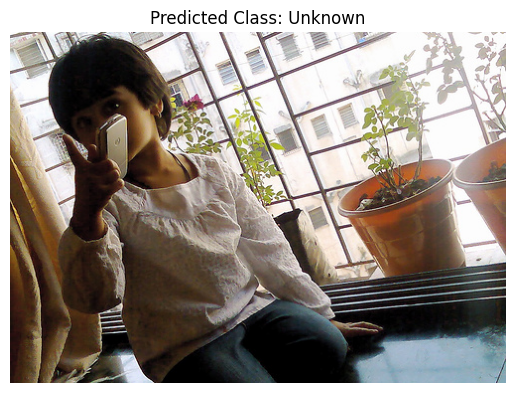

1/1 [==============================] - 0s 25ms/step


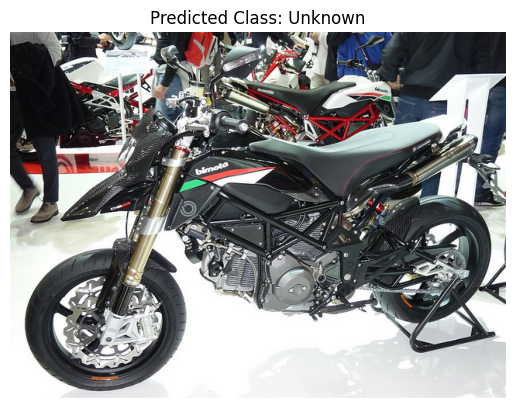

1/1 [==============================] - 0s 31ms/step


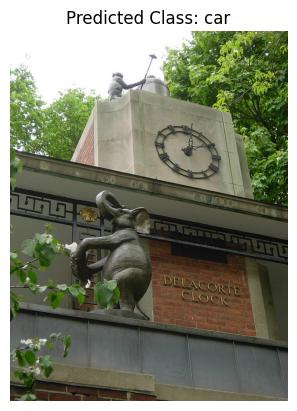

1/1 [==============================] - 0s 27ms/step


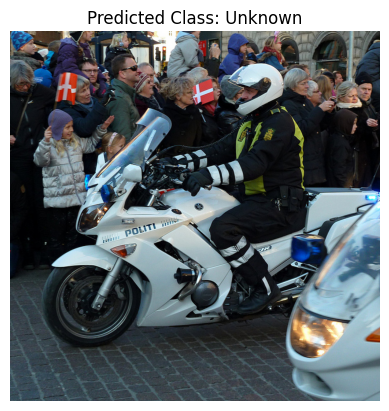

1/1 [==============================] - 0s 25ms/step


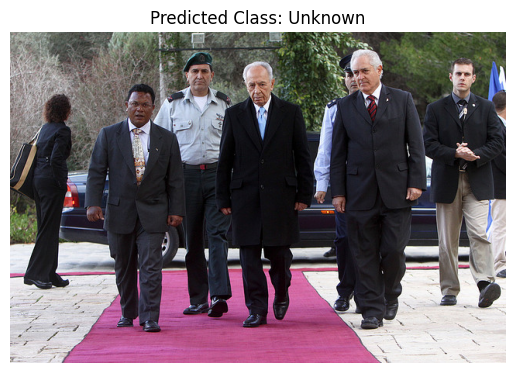

1/1 [==============================] - 0s 35ms/step


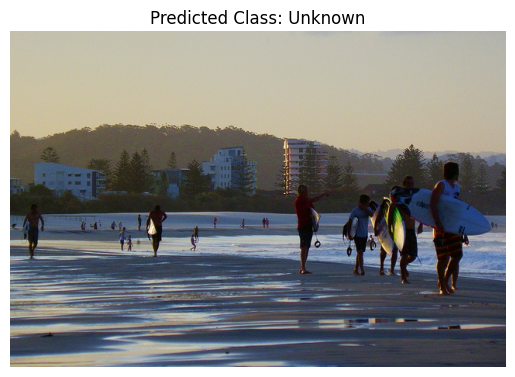

1/1 [==============================] - 0s 40ms/step


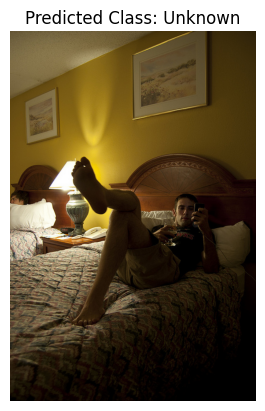

1/1 [==============================] - 0s 24ms/step


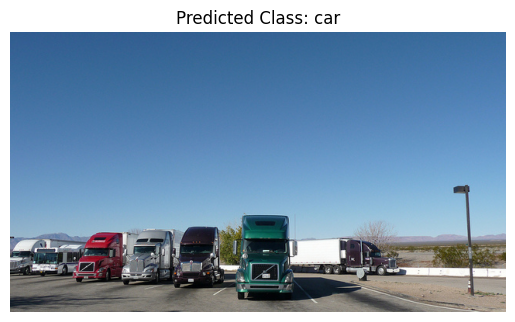

1/1 [==============================] - 0s 36ms/step


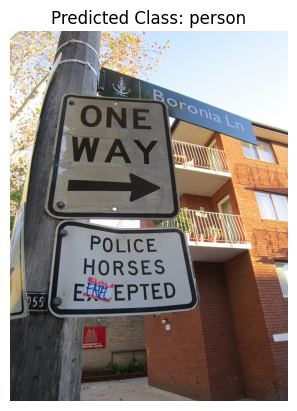

1/1 [==============================] - 0s 27ms/step


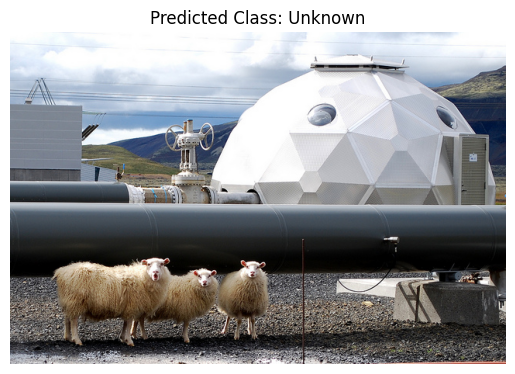

1/1 [==============================] - 0s 35ms/step


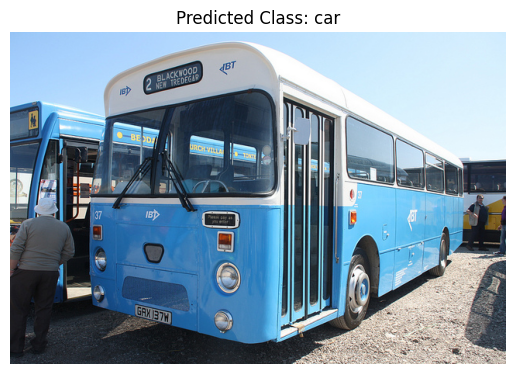

1/1 [==============================] - 0s 35ms/step


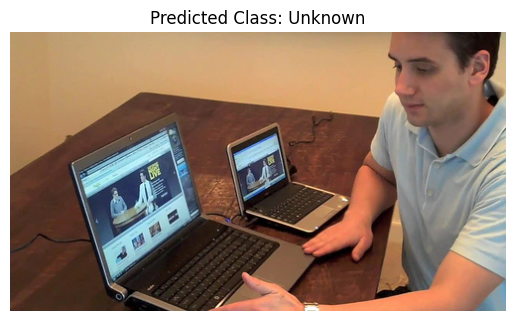

1/1 [==============================] - 0s 39ms/step


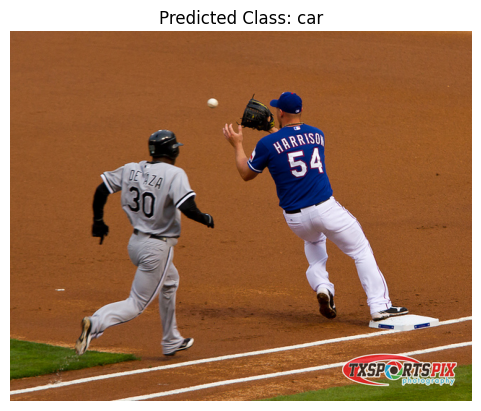

1/1 [==============================] - 0s 51ms/step


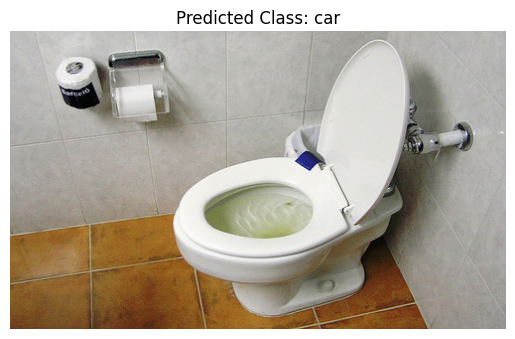

1/1 [==============================] - 0s 35ms/step


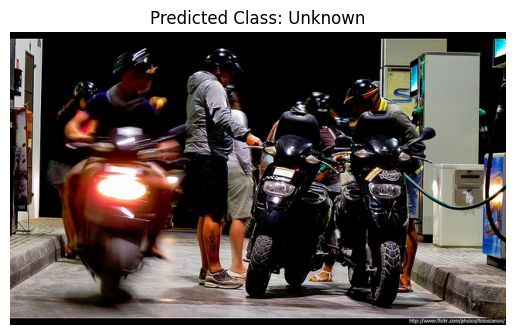

1/1 [==============================] - 0s 31ms/step


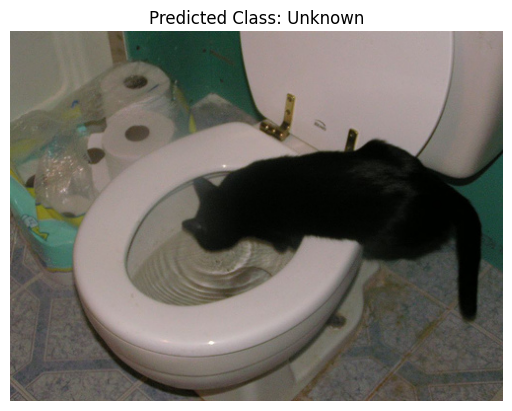

1/1 [==============================] - 0s 55ms/step


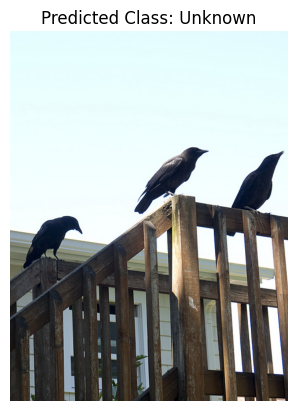

1/1 [==============================] - 0s 42ms/step


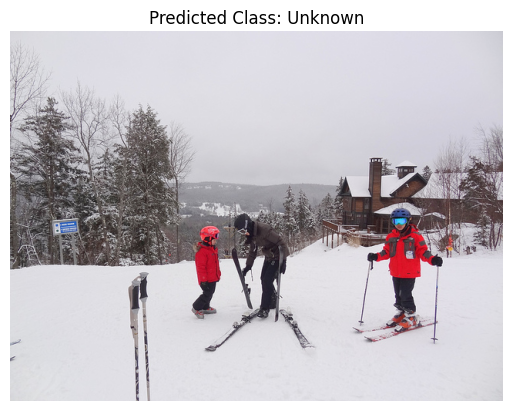

1/1 [==============================] - 0s 39ms/step


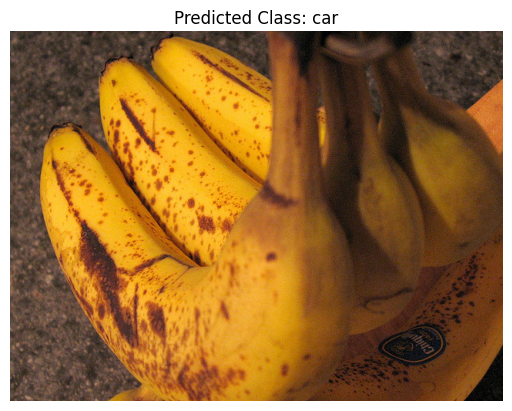

1/1 [==============================] - 0s 41ms/step


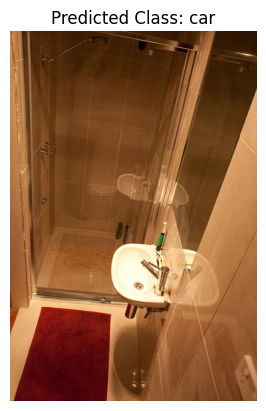

1/1 [==============================] - 0s 50ms/step


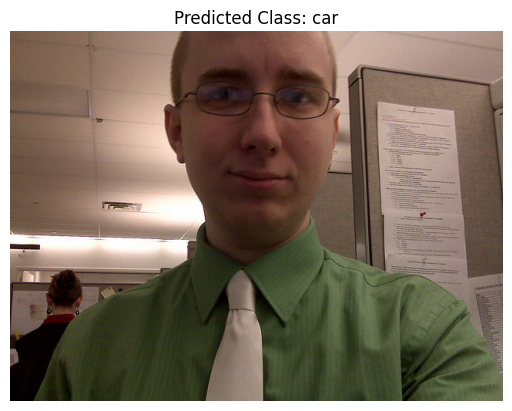

1/1 [==============================] - 0s 52ms/step


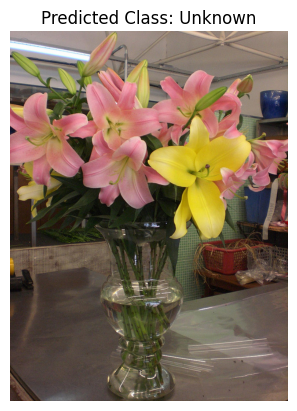

1/1 [==============================] - 0s 39ms/step


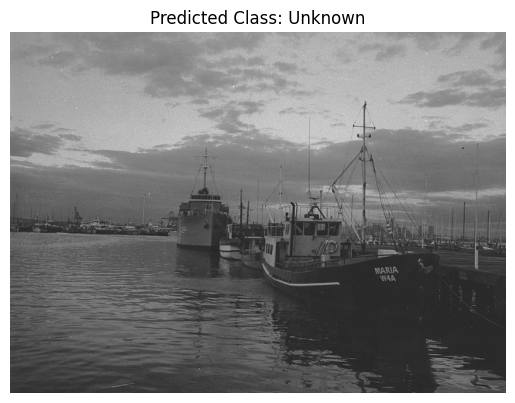

1/1 [==============================] - 0s 48ms/step


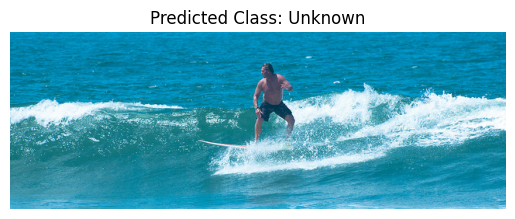

1/1 [==============================] - 0s 47ms/step


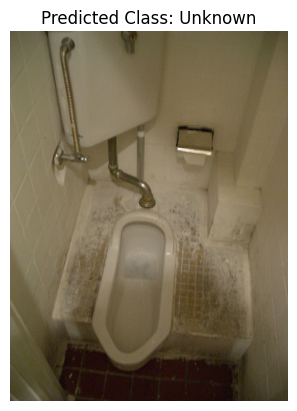

1/1 [==============================] - 0s 33ms/step


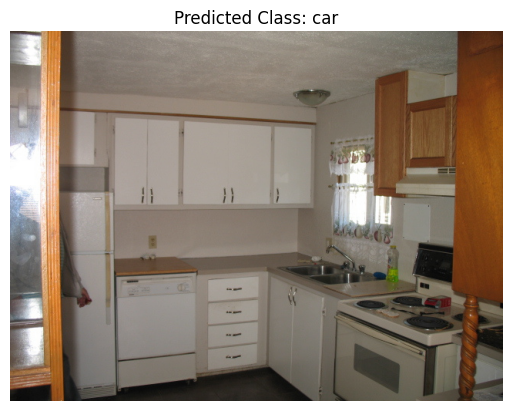

1/1 [==============================] - 0s 47ms/step


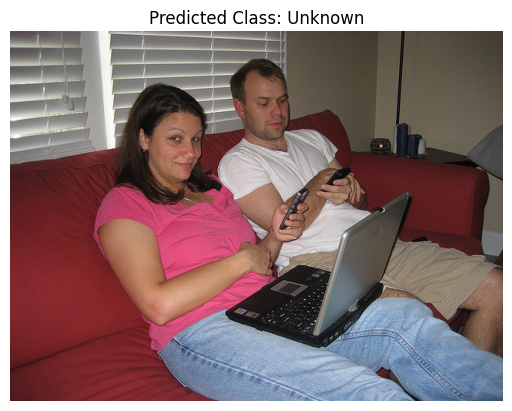

1/1 [==============================] - 0s 32ms/step


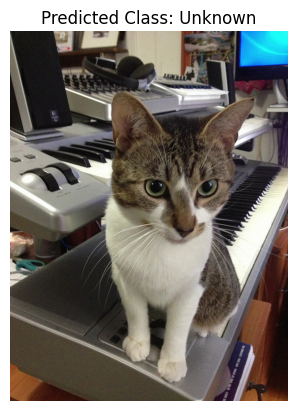

1/1 [==============================] - 0s 50ms/step


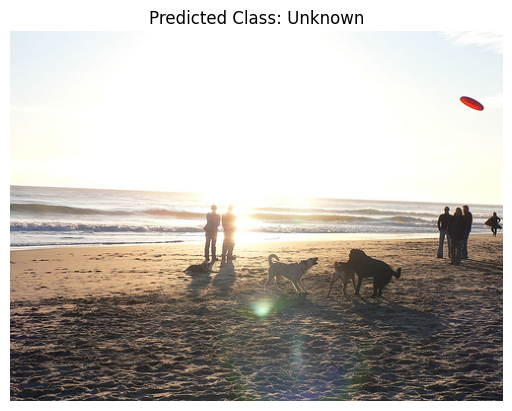

1/1 [==============================] - 0s 33ms/step


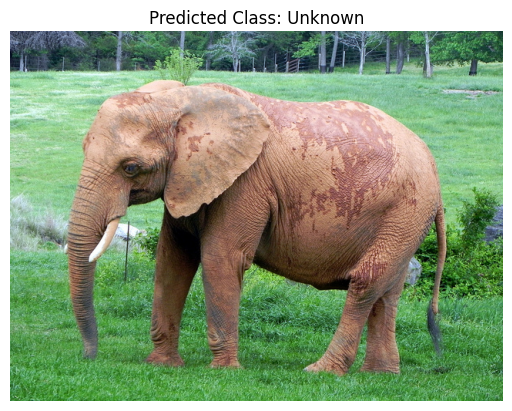

In [13]:
# Function to extract class keys from JSON file
def extract_class_keys(json_file_path):
    with open(json_file_path, 'r') as f:
        data = json.load(f)
    class_keys = {}
    for category in data['categories']:
        if category['name'] in ['person', 'car', 'dog', 'cake']:
            class_keys[category['id']] = category['name']
    return class_keys

# Function to perform inference on test images and display results using class keys
def predict_classes_and_display_with_keys(model, test_images, class_keys):
    for img_path in test_images:
        img = preprocess_image(img_path, (224, 224))
        img = np.expand_dims(img, axis=0)
        prediction = model.predict(img)
        predicted_class = np.argmax(prediction)
        if predicted_class not in class_keys:
            print(f"Warning: Predicted class index {predicted_class} is not in the expected range for image {img_path}.")
            predicted_label = 'Unknown'
        else:
            predicted_label = class_keys[predicted_class]
        # Display the image along with its predicted class
        image = Image.open(img_path)
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Predicted Class: {predicted_label}")
        plt.show()

# Load class keys from JSON file
json_file_path = "/content/drive/MyDrive/unzipped_dataset/train-300/labels.json"  # Update with the path to your labels.json file
class_keys = extract_class_keys(json_file_path)

# Perform inference on test images and display results using class keys
predict_classes_and_display_with_keys(model, test_image_paths, class_keys)

In [14]:
# Evaluate the model on test images
def evaluate_model(model, test_images, class_keys):
    num_correct = 0
    total_images = len(test_images)

    for img_path in test_images:
      img = preprocess_image(img_path, (224, 224))
      img = np.expand_dims(img, axis=0)
      prediction = model.predict(img)
      predicted_class = np.argmax(prediction)

      if predicted_class not in class_keys:
        print(f"Warning: Predicted class index {predicted_class} is not in the expected range for image {img_path}.")
      else:
        predicted_label = class_keys[predicted_class]
        print(f"Predicted Class for {img_path}: {predicted_label}")
        num_correct += 1
    accuracy = num_correct / total_images
    return accuracy

# Evaluate the model on test images and print accuracy
accuracy = evaluate_model(model, test_image_paths, class_keys)
print(f"Accuracy: {accuracy}")

1/1 [==============================] - 0s 24ms/step
Predicted Class for /content/drive/MyDrive/unzipped_dataset/test-30/000000001654.jpg: car
1/1 [==============================] - 0s 21ms/step
Predicted Class for /content/drive/MyDrive/unzipped_dataset/test-30/000000001494.jpg: car
1/1 [==============================] - 0s 22ms/step
Predicted Class for /content/drive/MyDrive/unzipped_dataset/test-30/000000001685.jpg: person
1/1 [==============================] - 0s 22ms/step
Predicted Class for /content/drive/MyDrive/unzipped_dataset/test-30/000000001411.jpg: car
1/1 [==============================] - 0s 22ms/step
Predicted Class for /content/drive/MyDrive/unzipped_dataset/test-30/000000001730.jpg: car
1/1 [==============================] - 0s 21ms/step
Predicted Class for /content/drive/MyDrive/unzipped_dataset/test-30/000000001717.jpg: car
1/1 [==============================] - 0s 24ms/step
Predicted Class for /content/drive/MyDrive/unzipped_dataset/test-30/000000001410.jpg: car
1/1

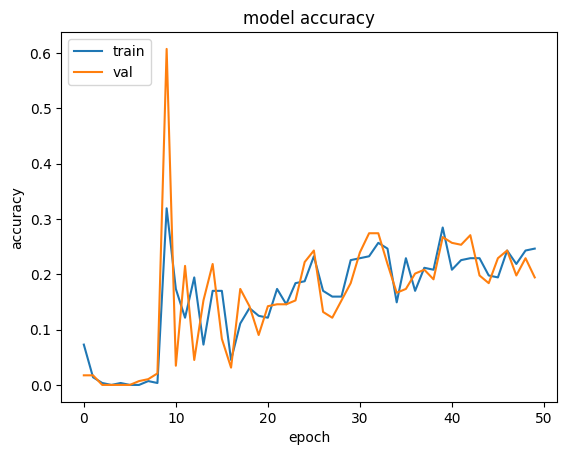

In [18]:
#plotting the accuracy chart
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()